
... ***CURRENTLY UNDER DEVELOPMENT*** ...


## SWAN simulations

inputs required: 
  * Sea and swell selected cases from ***MDA***

in this notebook:
  * SWAN mesh descriptions
  * SWAN simulations for sea and swell conditions
  * Read and store SWAN output at the location of study


### Workflow:

<div>
    <img src="../resources/nb02_02.png" width="400px">
</div>




The SWAN model allows to simulate the wave propagation in nearshore areas (Booij et al., 1999). The design points from notebook 02_01 provide the boundary conditions for a series of simulations from the SWAN model. SWAN was run in stationary mode. Sea and Swell conditions have been simulated independently and summed linearly afterwards. 

In [1]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-

# common
import os
import os.path as op

# pip
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt

# DEV: override installed teslakit
import sys
sys.path.insert(0, op.join(os.path.abspath(''), '..', '..',  '..'))

# teslakit
from teslakit.database import Database, hyswan_db

# swan custom toolbox
from teslakit.numerical_models.swan.wrap import SwanProject, SwanWrap_STAT
from teslakit.numerical_models.swan.plots.stat import scatter_maps


In [2]:
# swan module needs SWAN serial executable, more information at teslakit README.md file

# This function will copy a compiled executable to our module:

#from teslakit.numerical_models import swan
#swan.set_swan_binary_file('swan.exe')



## Database and Site parameters

In [3]:
# --------------------------------------
# Teslakit database

p_data = r'/media/administrador/HD/Dropbox/Guam/teslakit/data'
# p_data=r'/Users/laurac/Dropbox/Guam/teslakit/data'
db = Database(p_data)

# set site
db.SetSite('GUAM')

# hyswan simulation database
db_sim = hyswan_db(db.paths.site.HYSWAN.sim)



## SWAN: site files, main and nested grid descriptions

In [4]:
# SWAN site bathymetry files
p_swan = db.paths.site.HYSWAN.swan_site
p_swan_ext = op.join(p_swan, 'bathy_1km_buena.txt')
p_swan_int = op.join(p_swan, 'bathy_50m_buena.txt')

# SWAN site shore (for plots)
p_shore = op.join(p_swan, 'shore.npy')
np_shore = np.load(p_shore)

# SWAN grids description
main_grid = { #MALLA PRINCIPAL
    'xpc': 144.3,  # x origin
    'ypc': 13.20698344,    # y origin
    'alpc': 0,        # x-axis direction 
    'xlenc': 0.89092873,  # grid length in x
    'ylenc': 0.52195824,   # grid length in y
    'mxc': 100-1,       # number mesh x, una menos pq si no SWAN peta
    'myc': 59-1,        # number mesh y, una menos pq si no SWAN peta
    'dxinp': 1/111.12,    # size mesh x (resolution in x)
    'dyinp': 1/111.12,    # size mesh y (resolution in x)
}

nested_grid = { #MALLA ANIDADA
    'xpc': 144.59509259,
    'ypc': 13.41407407,
    'alpc': 0,
    'xlenc': 0.1475882,
    'ylenc': 0.11159108,
    'mxc': 329,
    'myc': 249,
    'dxinp': 0.05/111.12,
    'dyinp': 0.05/111.12,
}



## SWAN: SIMULATION SEA waves 

In [5]:
wvs_sea_subset = db_sim.Load('sea_subset')
posi=np.where(wvs_sea_subset['wind_speed']<=0)[0]
wvs_sea_subset['wind_speed'] = np.where(wvs_sea_subset['wind_speed']<=0,0.0001,wvs_sea_subset['wind_speed'])
posi

array([  1,   5,   8,  33,  40,  54, 117, 171, 403, 411, 432, 449, 451])

In [6]:
# load Historical sea MDA subset
# wvs_sea_subset = db_sim.Load('sea_subset')

# waves data hs and spr
#wvs_sea_subset['hs'] = 1
wvs_sea_subset['spr'] = 40
wvs_sea_subset.rename(columns={'tp':'per'}, inplace=True)  # rename Tp for swan wrapper
wvs_sea_subset.rename(columns={'wind_dir':'wdir'}, inplace=True)  # rename Tp for swan wrapper
wvs_sea_subset.rename(columns={'wind_speed':'wspd'}, inplace=True)  # rename Tp for swan wrapper


# swan project
p_swan = db_sim.paths['swan_projects']
sp = SwanProject(p_swan, 'sea')

# main mesh: depth and computational grid 
sp.mesh_main.dg = main_grid.copy()
sp.mesh_main.cg = main_grid.copy()
sp.mesh_main.depth = np.loadtxt(p_swan_ext)

# nested mesh: depth and computational grid 
sp.mesh_nest1.dg = nested_grid.copy()
sp.mesh_nest1.cg = nested_grid.copy()
sp.mesh_nest1.depth = np.loadtxt(p_swan_int)

# activate nested mesh
sp.run_nest1 = True
sp.wind = True

# SWAN parameters 
sp.params = {
    'sea_level': 0,
    'jonswap_gamma': 3,
    'coords_spherical': 'CCM',
    'waves_period': 'PEAK',
    'nested_bounds': 'CLOSED',
}
    
# SWAN project wrapper
sw = SwanWrap_STAT(sp)

# build and launch cases
#sw.build_cases(wvs_sea_subset)
# sw.run_cases()


<xarray.Dataset>
Dimensions:  (case: 500, lat: 58, lon: 99)
Coordinates:
  * lon      (lon) float64 144.3 144.3 144.3 144.3 ... 145.2 145.2 145.2 145.2
  * lat      (lat) float64 13.21 13.22 13.22 13.23 ... 13.69 13.7 13.71 13.72
Dimensions without coordinates: case
Data variables:
    Hsig     (case, lon, lat) float32 15.519109 15.427556 ... 3.499931 3.5001433
    Tm02     (case, lon, lat) float32 11.904744 11.999921 ... 5.6754866 5.658242
    Dir      (case, lon, lat) float32 27.51567 26.778595 ... 232.62479 231.83667
    Dspr     (case, lon, lat) float32 33.658096 32.970116 ... 32.364033
    TPsmoo   (case, lon, lat) float32 14.53669 14.535439 ... 7.2319427 7.245748


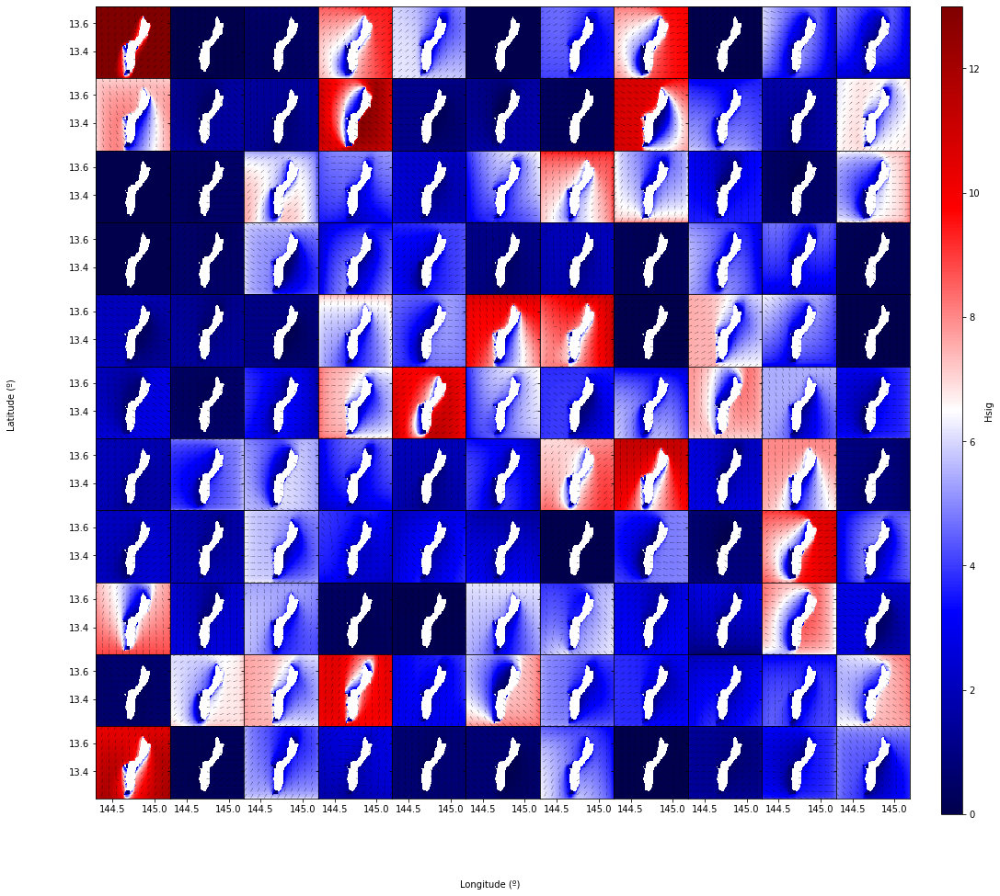

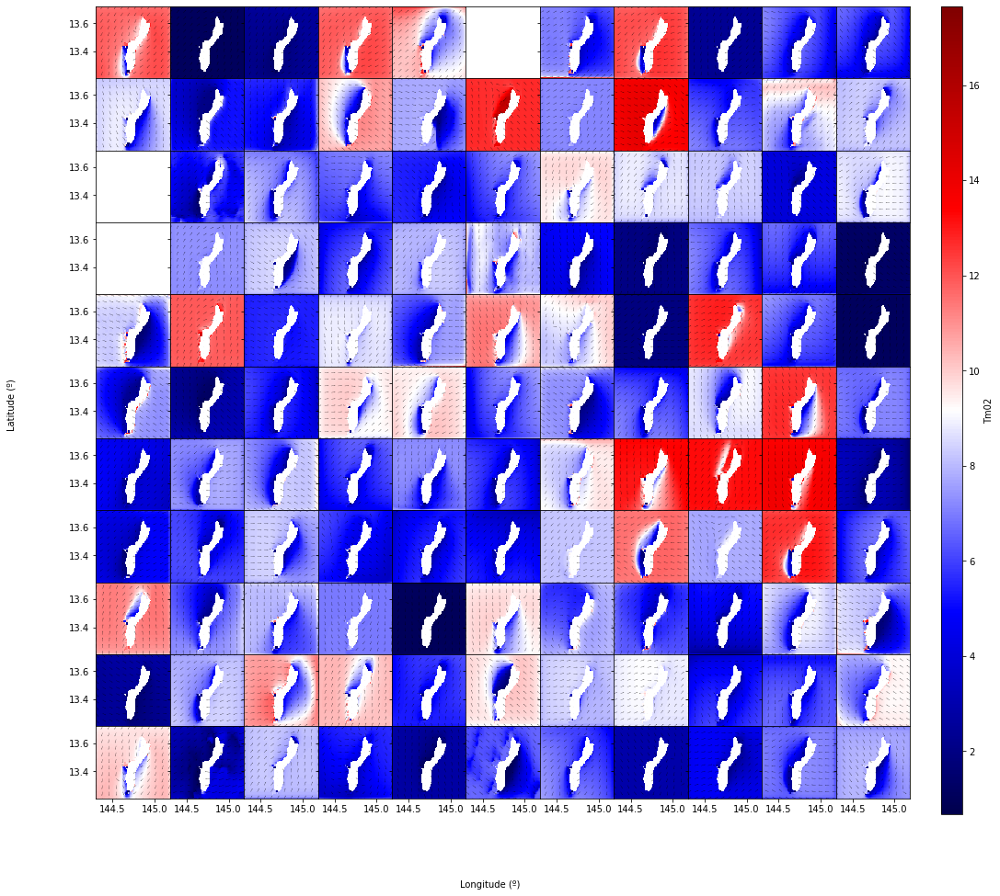

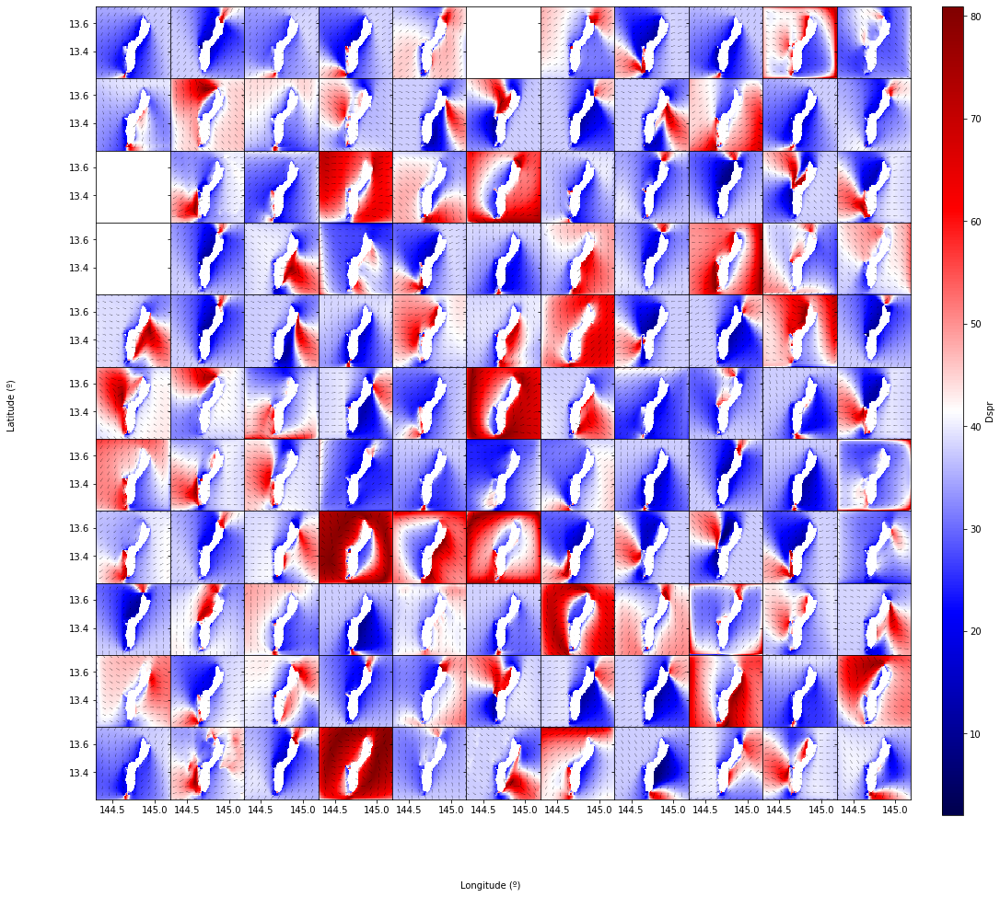

In [7]:
# extract output for main mesh
out_sea_mm_sim = sw.extract_output()
out_sea_mm_sim.to_netcdf(op.join(p_swan, 'out_main_sea.nc'))
print(out_sea_mm_sim)

# plot scatter maps
scatter_maps(out_sea_mm_sim, n_cases=121, var_limits={'Hsig':(0,13)}, np_shore=np_shore);


<xarray.Dataset>
Dimensions:  (case: 500, lat: 249, lon: 329)
Coordinates:
  * lon      (lon) float64 144.6 144.6 144.6 144.6 ... 144.7 144.7 144.7 144.7
  * lat      (lat) float64 13.41 13.41 13.41 13.42 ... 13.52 13.52 13.52 13.53
Dimensions without coordinates: case
Data variables:
    Hsig     (case, lon, lat) float32 10.498488 10.514716 ... 1.5997411
    Tm02     (case, lon, lat) float32 11.600124 11.708089 ... 5.8970957 6.458109
    Dir      (case, lon, lat) float32 358.21588 358.26923 ... 253.53247
    Dspr     (case, lon, lat) float32 20.629908 20.440691 ... 18.40015 8.2165575
    TPsmoo   (case, lon, lat) float32 14.292749 14.292314 ... 6.819235 6.8260026


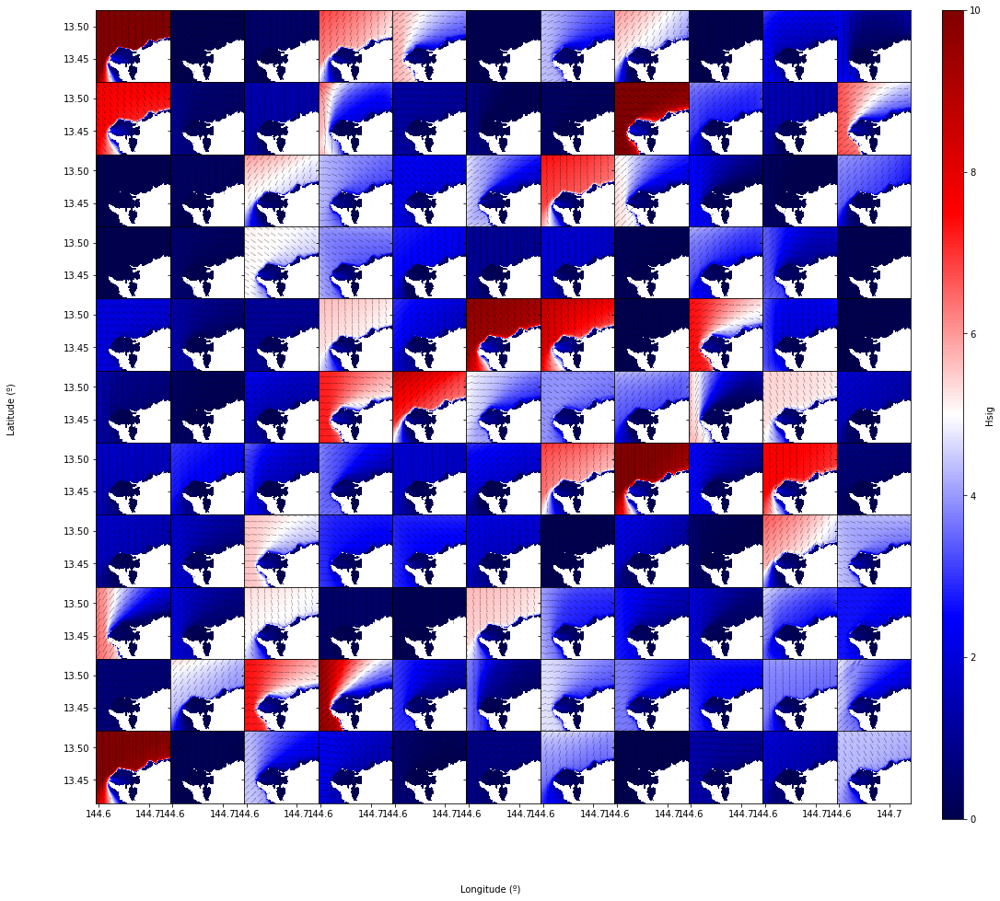

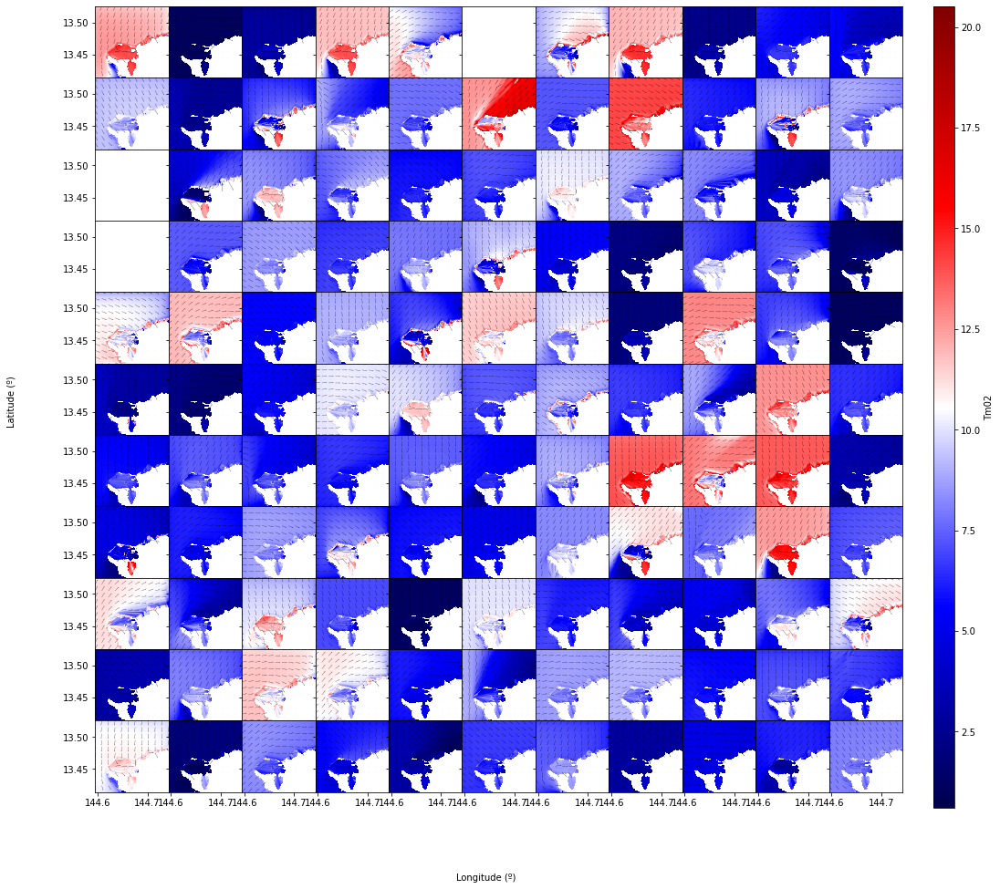

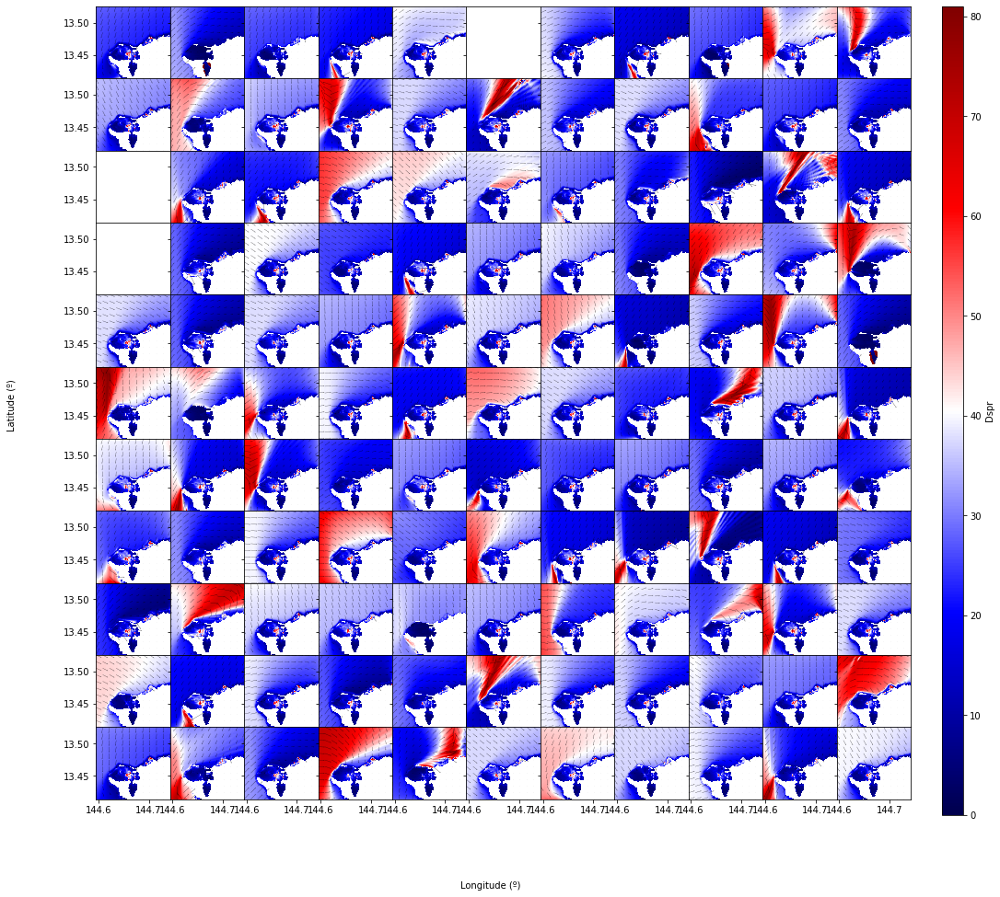

In [8]:
# extract output for nested mesh
out_sea_mn1_sim = sw.extract_output(mesh=sp.mesh_nest1)
out_sea_mn1_sim.to_netcdf(op.join(p_swan, 'out_nest1_sea.nc'))
print(out_sea_mn1_sim)

# plot scatter maps
scatter_maps(out_sea_mn1_sim, n_cases=121, var_limits={'Hsig':(0,10)}, np_shore=np_shore);



## SWAN: SIMULATION SWELL waves 

In [9]:
# #Fix a weird case
# wvs_swell_subset = db_sim.Load('swl_subset')
# # db_sim.Save('swl_subset', wvs_swl_sim_subset)
# print(wvs_swell_subset.tp[2])
# wvs_swell_subset.hs[2]=0.28
# wvs_swell_subset.tp[2]=2.651
# wvs_swell_subset.dir[2]=282.84
# wvs_swell_subset
# db_sim.Save('swl_subset', wvs_swell_subset)

In [10]:
# load Historical swell MDA subset
wvs_swell_subset = db_sim.Load('swl_subset')
# wvs_swell_subset=wvs_swell_subset[2:3]
wvs_swell_subset=wvs_swell_subset.drop('n_sim',axis='columns')

# waves data hs and spr
wvs_swell_subset['hs'] = 1
wvs_swell_subset['spr'] = 10
wvs_swell_subset.rename(columns={'tp':'per'}, inplace=True)  # rename Tp for swan wrapper

#When tp>5 change hs from 1 to 0.1 to avoid conflicts 
wvs_swell_subset['hs'] = np.where(wvs_swell_subset['per']<5,0.1,wvs_swell_subset['hs'])

# swan project
p_swan = db_sim.paths['swan_projects']
sp = SwanProject(p_swan, 'swell')


# main mesh: depth and computational grid 
sp.mesh_main.dg = main_grid.copy()
sp.mesh_main.cg = main_grid.copy()
sp.mesh_main.depth = np.loadtxt(p_swan_ext)

# nested mesh: depth and computational grid 
sp.mesh_nest1.dg = nested_grid.copy()
sp.mesh_nest1.cg = nested_grid.copy()
sp.mesh_nest1.depth = np.loadtxt(p_swan_int)

# wind
sp.wind = False

# activate nested mesh
sp.run_nest1 = True


# SWAN parameters 
sp.params = {
    'sea_level': 0,
    'jonswap_gamma': 10,
    'coords_spherical': 'CCM',
    'waves_period': 'PEAK',
    'nested_bounds': 'CLOSED',
}

    
# SWAN project wrapper
sw1 = SwanWrap_STAT(sp)

# build and launch cases
# sw1.build_cases(wvs_swell_subset)
# sw1.run_cases()


<xarray.Dataset>
Dimensions:  (case: 500, lat: 58, lon: 99)
Coordinates:
  * lon      (lon) float64 144.3 144.3 144.3 144.3 ... 145.2 145.2 145.2 145.2
  * lat      (lat) float64 13.21 13.22 13.22 13.23 ... 13.69 13.7 13.71 13.72
Dimensions without coordinates: case
Data variables:
    Tm02     (case, lon, lat) float32 21.102476 21.102428 ... 8.136849 8.1372175
    Dir      (case, lon, lat) float32 3.156372 3.1567688 ... 204.15045 204.04875
    Dspr     (case, lon, lat) float32 10.103277 10.103433 ... 9.26139 9.190191
    TPsmoo   (case, lon, lat) float32 24.576534 24.576532 ... 9.408896 9.408842
    Hsig     (case, lon, lat) float32 0.96767074 0.9676829 ... 0.96990436


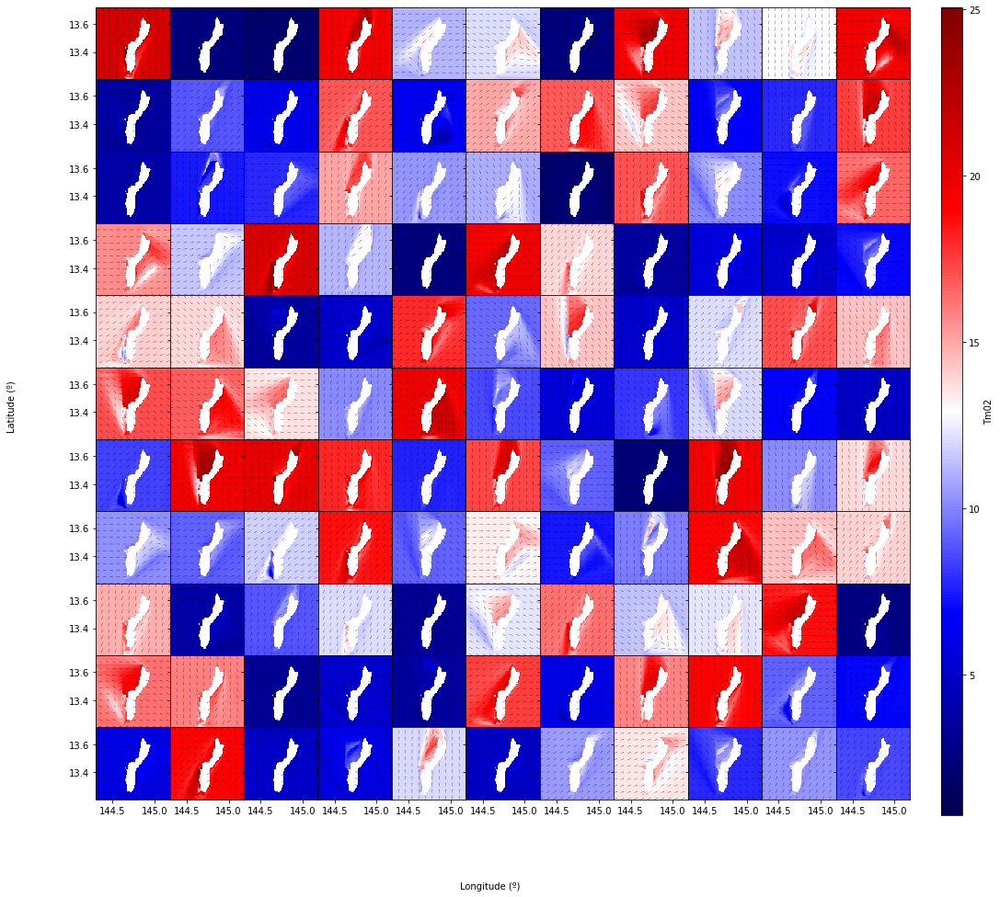

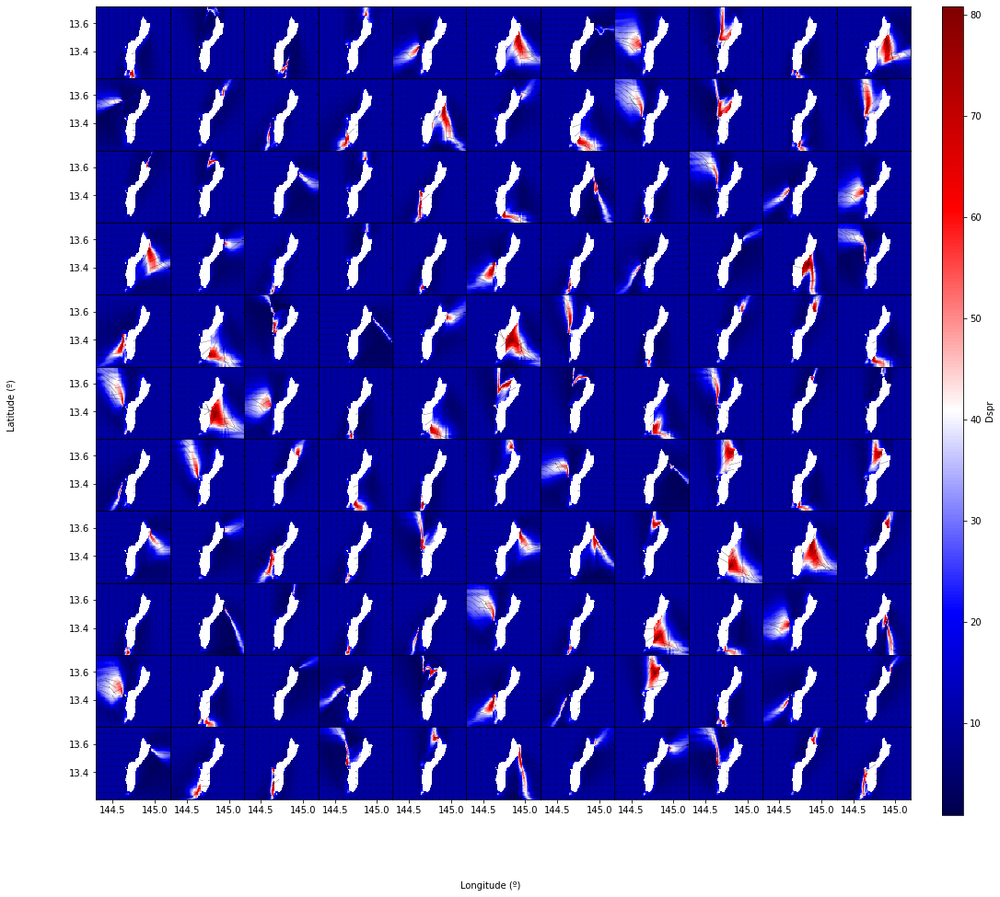

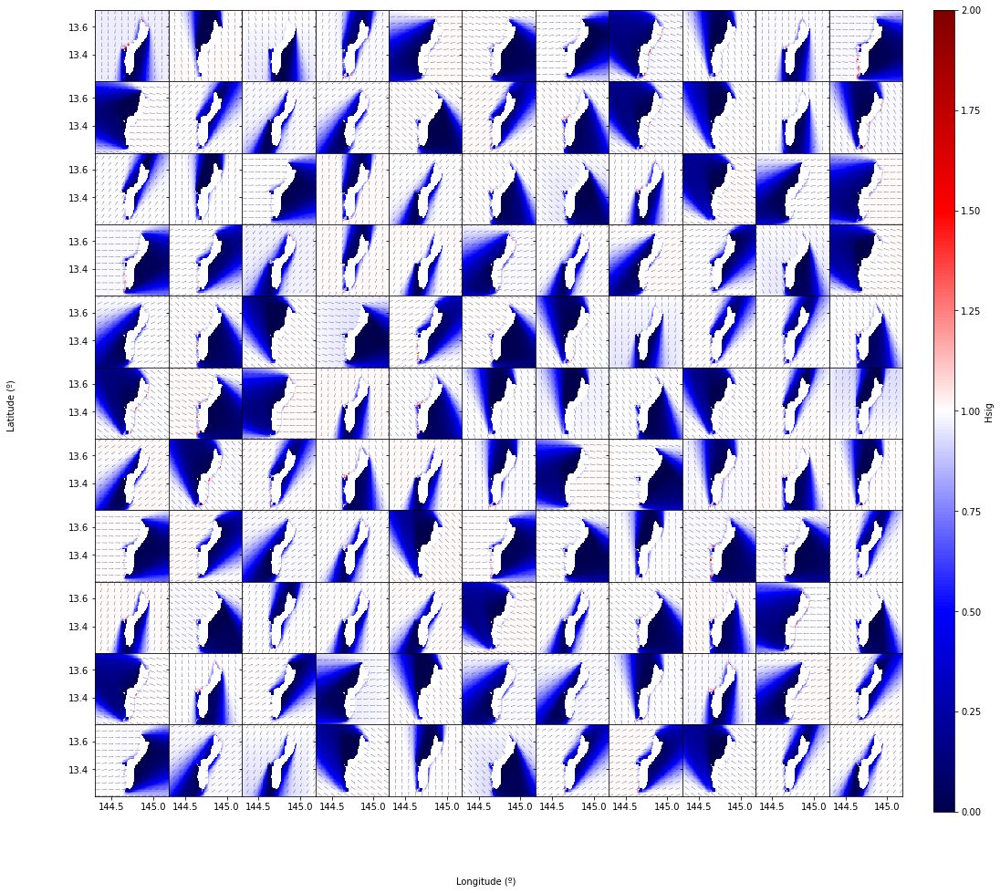

In [11]:
out_swl_mm_sim = sw1.extract_output()

#Correct propagation factor for tp>5 multiplying by 10
h=out_swl_mm_sim['Hsig']
h[np.where(wvs_swell_subset['per']<5)[0],:,:]=h[np.where(wvs_swell_subset['per']<5)[0],:,:]*10
#  = np.where(wvs_swell_subset['per']<5,out_swl_mm_sim['Hsig']*10,out_swl_mm_sim['Hsig'])
out_swl_mm_sim=out_swl_mm_sim.drop('Hsig')
out_swl_mm_sim['Hsig']=h
####

out_swl_mm_sim.to_netcdf(op.join(p_swan, 'out_main_swl.nc'))
print(out_swl_mm_sim)
# plot scatter maps
scatter_maps(out_swl_mm_sim, n_cases=121, var_limits={'Hsig':(0,2)}, np_shore=np_shore);


<xarray.Dataset>
Dimensions:  (case: 500, lat: 249, lon: 329)
Coordinates:
  * lon      (lon) float64 144.6 144.6 144.6 144.6 ... 144.7 144.7 144.7 144.7
  * lat      (lat) float64 13.41 13.41 13.41 13.42 ... 13.52 13.52 13.52 13.53
Dimensions without coordinates: case
Data variables:
    Tm02     (case, lon, lat) float32 21.08885 21.091513 ... 9.020308 9.115181
    Dir      (case, lon, lat) float32 2.3851624 2.4155884 ... 242.61542
    Dspr     (case, lon, lat) float32 9.428729 9.45304 ... 0.74493057 0.76540023
    TPsmoo   (case, lon, lat) float32 24.609095 24.609102 ... 9.748791 9.752762
    Hsig     (case, lon, lat) float32 0.9253644 0.9260964 ... 0.024204144


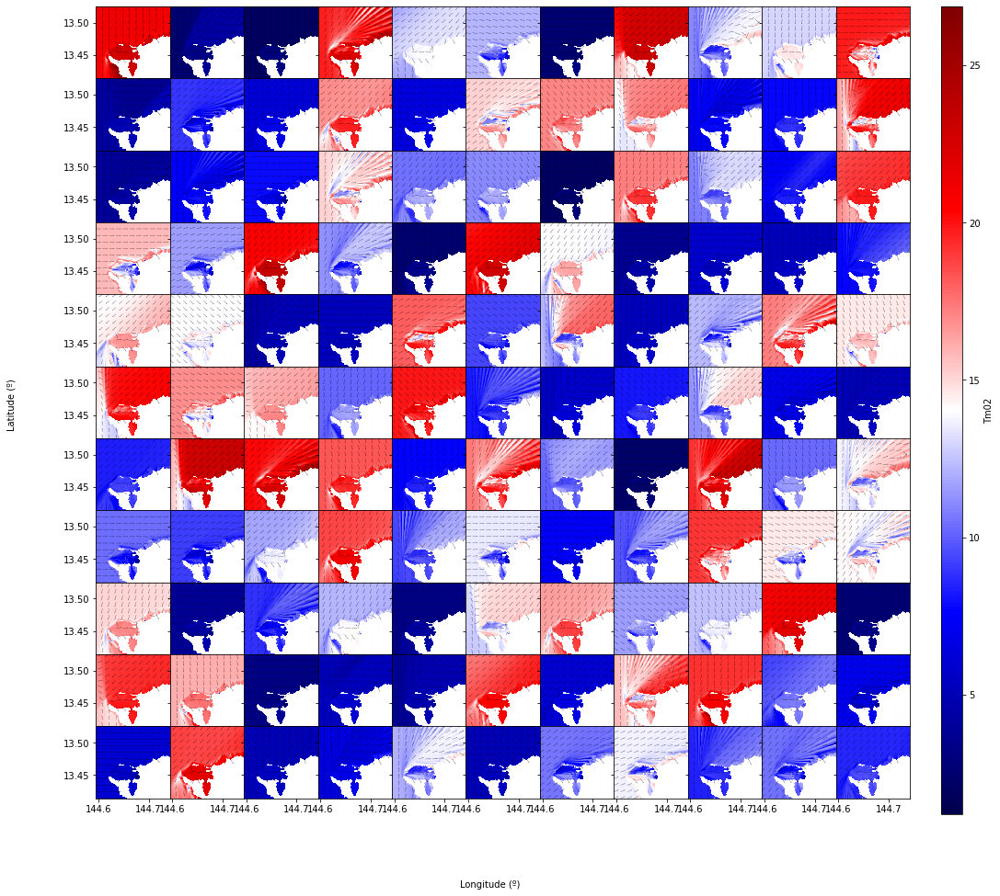

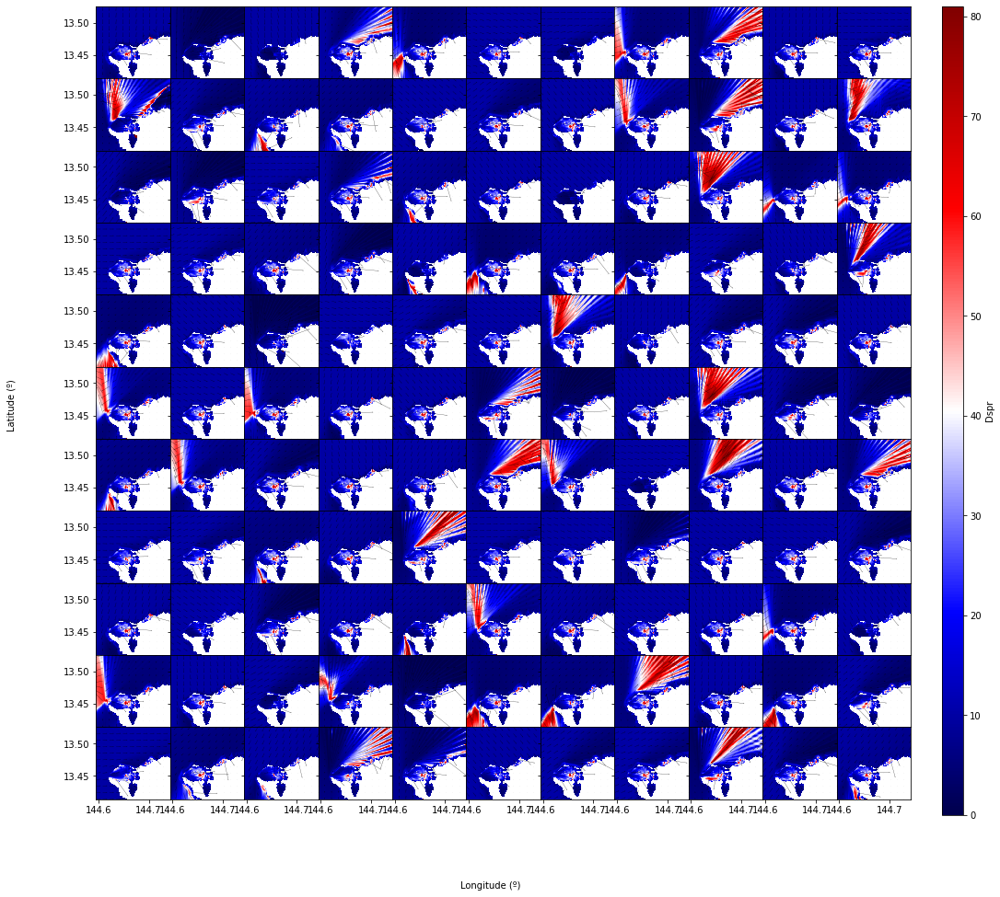

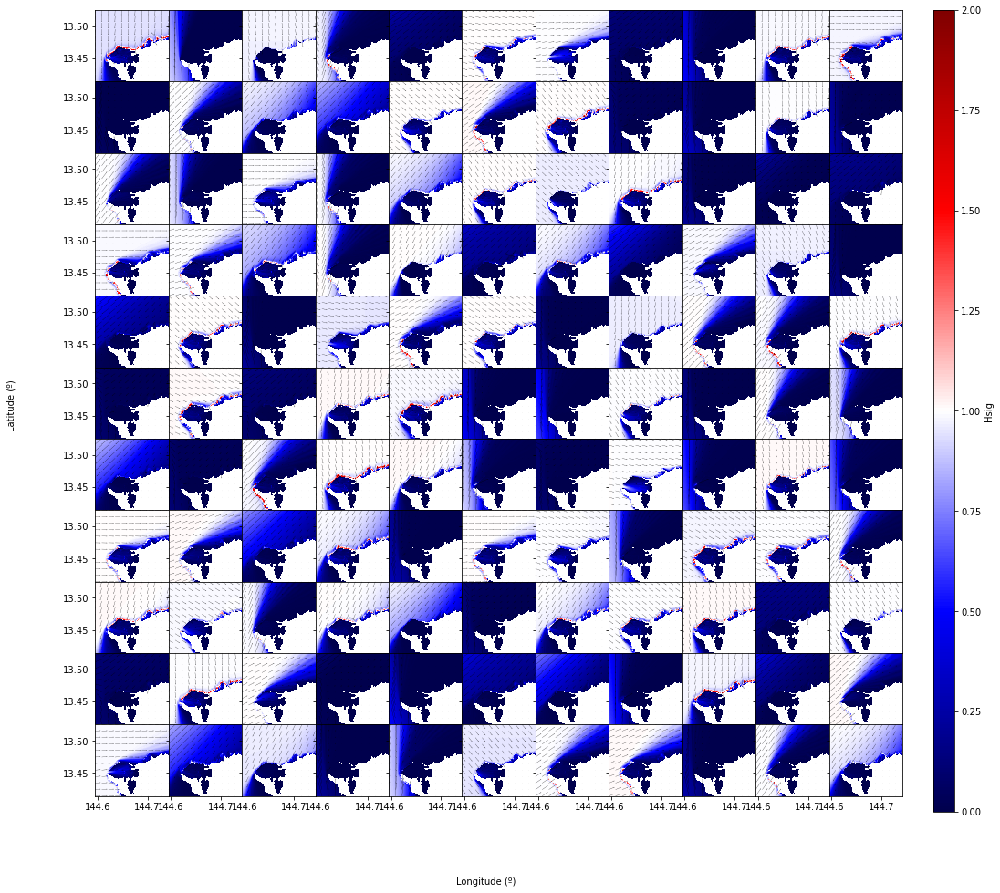

In [13]:
# extract output for nested mesh
out_swl_mn1_sim = sw1.extract_output(mesh=sp.mesh_nest1)

#Correct propagation factor for tp>5 multiplying by 10
h=out_swl_mn1_sim['Hsig']
h[np.where(wvs_swell_subset['per']<5)[0],:,:]=h[np.where(wvs_swell_subset['per']<5)[0],:,:]*10
#  = np.where(wvs_swell_subset['per']<5,out_swl_mm_sim['Hsig']*10,out_swl_mm_sim['Hsig'])
out_swl_mn1_sim=out_swl_mn1_sim.drop('Hsig')
out_swl_mn1_sim['Hsig']=h
####


out_swl_mn1_sim.to_netcdf(op.join(p_swan, 'out_nest1_swl.nc'))
print(out_swl_mn1_sim)

# plot scatter maps
scatter_maps(out_swl_mn1_sim, n_cases=121, var_limits={'Hsig':(0,2)}, np_shore=np_shore);


## RBF Reconstruction target: SIMULATION Point SEA and SWELLs propagations

(0.0, 421.3065877592957)

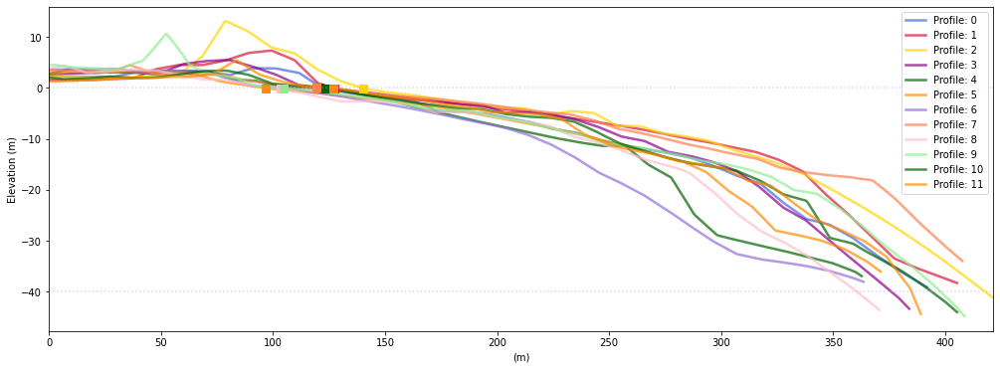

In [14]:
#Load profiles
profiles=xr.open_dataset('/media/administrador/HD/Dropbox/Guam/bati guam/Profiles_Guam_curt.nc')
profiles

from matplotlib import gridspec
colors=['royalblue','crimson','gold','darkmagenta','darkgreen','darkorange','mediumpurple','coral','pink','lightgreen','darkgreen','darkorange']
fig=plt.figure(figsize=[17,6])
gs1=gridspec.GridSpec(1,1)
ax=fig.add_subplot(gs1[0])

for a in range(len(profiles.profile)):
    ax.plot(profiles.Distance_profile[:,a], profiles.Elevation[:,a],linewidth=2.5,color=colors[a],alpha=0.7,label='Profile: ' + str(a))
for a in range(len(profiles.profile)):
    s=np.where(profiles.Elevation[:,a]<0)[0][0]
    ax.plot(profiles.Distance_profile[s,a],profiles.Elevation[s,a],'s',color=colors[a],markersize=8)
ax.plot([0,1500],[0,0],':',color='plum',alpha=0.5)
ax.plot([0,1500],[-40,-40],':',color='plum',alpha=0.5)

ax.set_xlabel(r'(m)')
ax.set_ylabel(r'Elevation (m)')
ax.legend()
ax.set_xlim([0,np.nanmax(profiles.Distance_profile)])

## Limit maximum depth

In [48]:
cut_d=-20

pos_depth=np.full([len(profiles.profile)],np.nan)
p_lon=np.full([len(profiles.profile)],np.nan)
p_lat=np.full([len(profiles.profile)],np.nan)

for a in range(len(profiles.profile)):
    pos_depth[a]=np.argmin(np.abs(profiles.Elevation.values[:,a]-cut_d))
    p_lon[a]=profiles.Lon.values[pos_depth[a].astype('int'),a]
    p_lat[a]=profiles.Lat.values[pos_depth[a].astype('int'),a]
    print('PROF: ' + str(a) + ': elevation= '+ str(profiles.Elevation.values[pos_depth[a].astype('int'),a]))



PROF: 0: elevation= -19.86490593164206
PROF: 1: elevation= -19.883073991878277
PROF: 2: elevation= -19.96974233793259
PROF: 3: elevation= -19.987905748062477
PROF: 4: elevation= -20.089361072756077
PROF: 5: elevation= -20.0014702538436
PROF: 6: elevation= -19.965900125076942
PROF: 7: elevation= -19.875949593474118
PROF: 8: elevation= -20.06537977990458
PROF: 9: elevation= -20.02820964850104
PROF: 10: elevation= -19.912186371102827
PROF: 11: elevation= -19.914111239526086


In [49]:
# p_lon=profiles.Lon.values[-1,:]
# p_lat=profiles.Lat.values[-1,:]

for a in range(len(p_lon)):
    
    ix_lon=np.argmin(np.abs(out_sea_mn1_sim.lon.values-p_lon[a]))
    ix_lat=np.argmin(np.abs(out_sea_mn1_sim.lat.values-p_lat[a]))
    
    xx_sea=out_sea_mn1_sim.isel({'lon':ix_lon, 'lat':ix_lat})
    xx_sea=xx_sea.expand_dims(profile=[a])
    xx_sea=xx_sea.assign_coords(lon=("profile", [xx_sea.lon.values]))
    xx_sea=xx_sea.assign_coords(lat=("profile", [xx_sea.lat.values]))
    
    xx_swell=out_swl_mn1_sim.isel({'lon':ix_lon, 'lat':ix_lat})
    xx_swell=xx_swell.expand_dims(profile=[a])
    xx_swell=xx_swell.assign_coords(lon=("profile", [xx_swell.lon.values]))
    xx_swell=xx_swell.assign_coords(lat=("profile", [xx_swell.lat.values]))
    
    if a==0:
        sea=xx_sea
        swell=xx_swell
    else:
        sea = xr.combine_by_coords([sea,xx_sea])
        swell = xr.combine_by_coords([swell,xx_swell])
        
print(sea)
print(swell)

<xarray.Dataset>
Dimensions:  (case: 500, profile: 12)
Coordinates:
  * profile  (profile) int64 0 1 2 3 4 5 6 7 8 9 10 11
    lon      (profile) float64 144.7 144.7 144.7 144.7 ... 144.7 144.7 144.7
    lat      (profile) float64 13.47 13.47 13.47 13.47 ... 13.47 13.47 13.47
Dimensions without coordinates: case
Data variables:
    Hsig     (profile, case) float32 11.475504 0.0003230299 ... 1.093459
    Tm02     (profile, case) float32 12.748263 1.1123928 ... 3.8404465 5.5531306
    Dir      (profile, case) float32 13.002502 283.34332 ... 338.623 290.83463
    Dspr     (profile, case) float32 15.67729 8.772659 ... 45.837055 12.9067
    TPsmoo   (profile, case) float32 14.310598 1.6030458 ... 6.6491714 6.30407
<xarray.Dataset>
Dimensions:  (case: 500, profile: 12)
Coordinates:
  * profile  (profile) int64 0 1 2 3 4 5 6 7 8 9 10 11
    lon      (profile) float64 144.7 144.7 144.7 144.7 ... 144.7 144.7 144.7
    lat      (profile) float64 13.47 13.47 13.47 13.47 ... 13.47 13.47 13.47
Dime

In [50]:
db_sim.Save('sea_target', sea.to_dataframe())
db_sim.Save('swl_target', swell.to_dataframe())